Create a map to represent the networks in India which we are including in the AccelNet 2021 proposal
I found the following documents describing the various experimental collaborations:
  * EIC: slide 11 https://indico.bnl.gov/event/7352/contributions/39376/attachments/29384/45636/EIC-India-IB_Mtg-15July2020_compressed.pdf
  * DUNE: https://lbnf-dune.fnal.gov/about/countries-and-institutions-participating-in-dune/
  * CMS: https://www.tifr.res.in/~indiacms/
  * INO: http://www.ino.tifr.res.in/ino/collaboration.php
  * CMS: https://cms.cern.ch/iCMS/jsp/secr/sqlPdb.jsp?type=list (From Kajari Mazumdar, "Please consider TIFR as only one CMS group. Please leave out BARC, since they have pulled out")
 
Slide 24 of the following is also interesting regarding India and simulations:
  * https://www.niser.ac.in/daehep2020/talkposter/Abhay_Deshpande__836_751.pdf
  
Technical notes about using CartoPy for this case:

  * Nice general notes on using CartoPy: https://rabernat.github.io/research_computing_2018/maps-with-cartopy.html
  * General notes on zooming in to a specific country can be found here: https://stackoverflow.com/questions/61269758/python-updated-political-map-of-india-with-state-boundaries
  * The stock image is rather low resolution, so zooming in on India makes for an ugly map. Notes on improving this can be found here: https://stackoverflow.com/questions/67508054/improve-resolution-of-cartopy-map

In [8]:
%matplotlib inline
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import csv
import os

[]

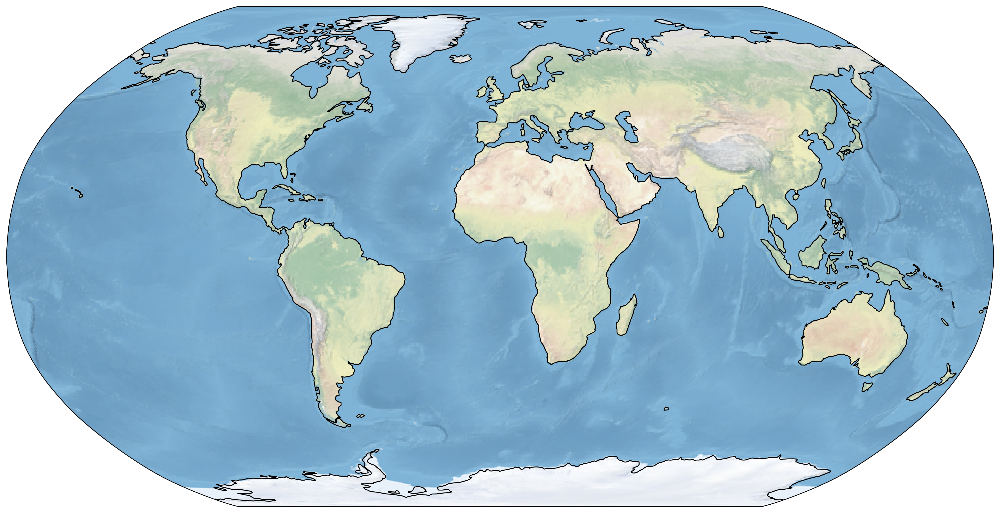

In [9]:
fig = plt.figure(figsize=(20, 10),dpi=300)
ax = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson())

# make the map global rather than have it zoom in to
# the extents of any plotted data
ax.set_global()

ax.stock_img()
ax.coastlines()
ax.plot()

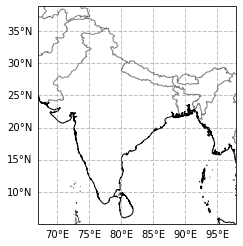

In [10]:
fig, ax = plt.subplots(subplot_kw=dict(projection=ccrs.PlateCarree()))
ax.set_extent([67.0, 98.0, 5.0, 38.0])
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.5,
                  linestyle='--')
gl.xlabels_top = False
gl.ylabels_right = False
ax.coastlines(color='black', linewidth=1, resolution='10m')
ax.add_feature(cfeature.BORDERS.with_scale('10m'),
               linestyle='-', alpha=.5)

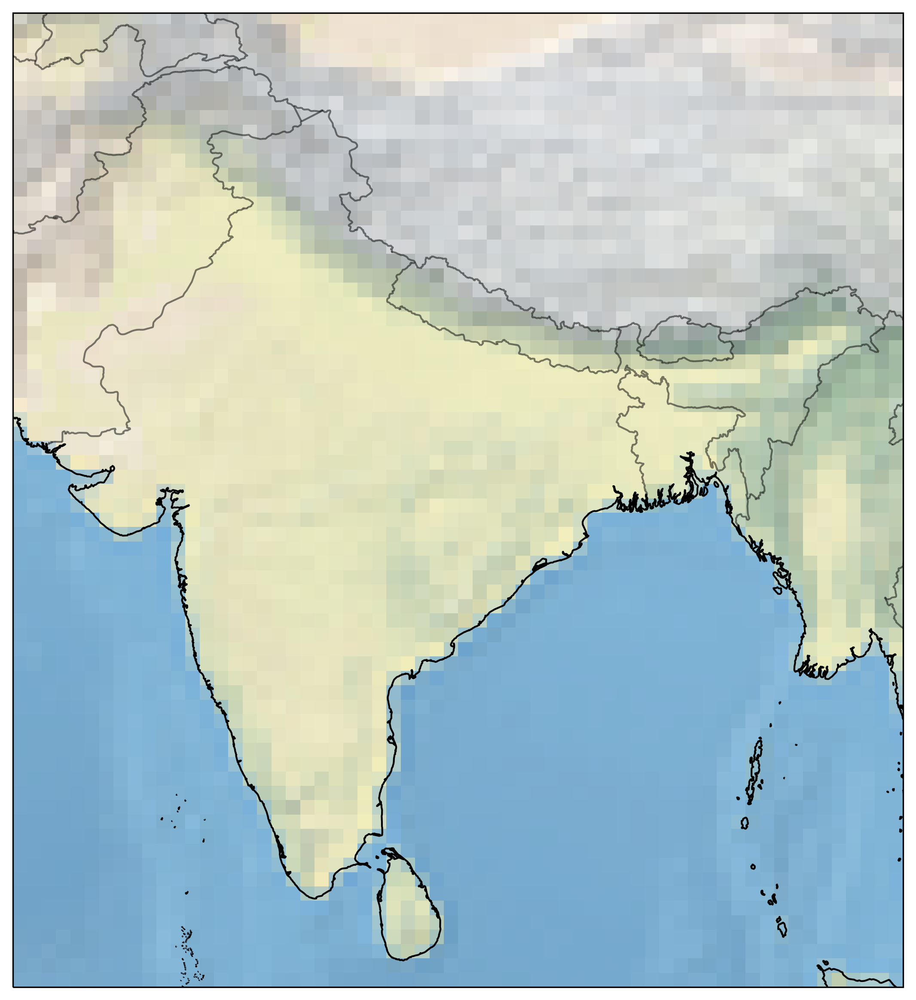

In [11]:
fig, ax = plt.subplots(figsize=(20, 10),dpi=300,subplot_kw=dict(projection=ccrs.PlateCarree()))
ax.set_extent([67.0, 98.0, 5.0, 38.0])
ax.stock_img()
gl.xlabels_top = False
gl.ylabels_right = False
ax.coastlines(color='black', linewidth=1, resolution='10m')
ax.add_feature(cfeature.BORDERS.with_scale('10m'),
               linestyle='-', alpha=.5)

In [14]:
os.environ["CARTOPY_USER_BACKGROUNDS"] = "images/"

In [54]:
# Load the cities
cityrows = []
with open('india-cities.csv') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=':')
    for row in csv_reader:
        cityrows.append(row) 
#     citylon = {rows[0]:rows[1] for rows in csv_reader}
    
# with open('india-cities.csv') as csv_file:
#     csv_reader = csv.reader(csv_file, delimiter=':')
#     citylat = {rows[0]:rows[2] for rows in csv_reader}
    
# for mykey,myvalue in citylon.items():
# for row in cityrows:
#     print (row[0] + " => " + row[1] + " + " + row[2])

In [ ]:
# Define a function to do different small offsets for each network


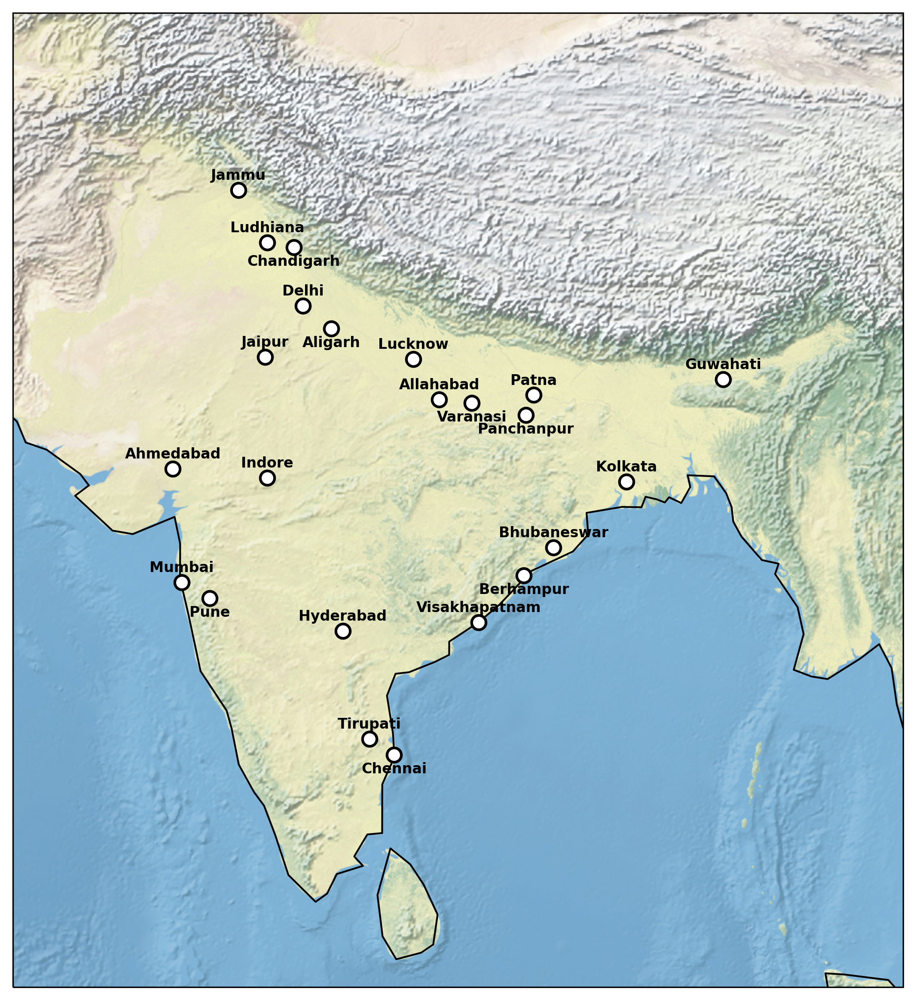

In [56]:
plt.figure(figsize=(20,10),dpi=300)

ax = plt.subplot(111, projection=ccrs.PlateCarree())
#ax.background_img(name='BM', resolution='high')
#ax.background_img(name='ETOPO', resolution='high')
ax.background_img(name='NEFULL', resolution='high')

for row in cityrows:
    mylongitude=float(row[1])
    mylatitude=float(row[2])
    lontextoffset=float(row[3])
    lattextoffset=float(row[4])
    mysum = mylongitude + mylatitude
#     print(mylongitude + " ==> " + mylatitude + " ==> " + mysum)
#     print(mysum)
    ax.text(mylongitude+lontextoffset, mylatitude+lattextoffset, str(row[0]), weight='bold', fontsize=8,
        horizontalalignment='center',
        verticalalignment='center',
        transform=ccrs.PlateCarree())
    ax.plot(mylongitude,mylatitude,
        color='white', linewidth=2, marker='o', markersize=8,
        markeredgewidth=1.5, markeredgecolor=(0, 0, 0, 1),
        transform=ccrs.PlateCarree()
         )


    
ax.set_extent([67.0, 98.0, 5.0, 38.0])
# mm = ax.pcolormesh(lon_cyc,\
#                    lat,\
#                    temp_cyc,\
#                    vmin=-2,\
#                    vmax=30,\
#                    transform=ccrs.PlateCarree(),\
#                    cmap=cmo.balance )
ax.coastlines(resolution='110m');
